# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [ ]:
# # install dependencies: 
# !pip install pyyaml==5.1
# import torch, torchvision
# print(torch.__version__, torch.cuda.is_available())
# !gcc --version
# # opencv is pre-installed on colab

In [ ]:
# # install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# import torch
# #assert torch.__version__.startswith("1.7")
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# # exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

# Train on a custom dataset

In [8]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')
# drive.flush_and_unmount()

Mounted at /content/gdrive


In [9]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

     |████████████████████████████████| 831.4 MB 6.9 kB/s 
     |████████████████████████████████| 22.1 MB 1.5 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu111
    Uninstalling torch-1.9.0+cu111:
      Successfully uninstalled torch-1.9.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu111
    Uninstalling torchvision-0.10.0+cu111:
      Successfully uninstalled torchvision-0.10.0+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.9.1 which is incompatible.
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-lk0ogejd
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-lk0ogejd
     |████████████████████████████████| 596 kB 5.4 MB/s 
  Created 

'1.9.1+cu102'

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [10]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 13345, done.
remote: Counting objects: 100% (846/846), done.
remote: Compressing objects: 100% (437/437), done.
remote: Total 13345 (delta 527), reused 667 (delta 404), pack-reused 12499
Receiving objects: 100% (13345/13345), 5.71 MiB | 16.37 MiB/s, done.
Resolving deltas: 100% (9483/9483), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 74 kB 2.3 MB/s 
     |████████████████████████████████| 145 kB 11.3 MB/s 
     |████████████████████████████████| 130 kB 42.6 MB/s 
     |████████████████████████████████| 748 kB 40.9 MB/s 
     |████████████████████████████████| 743 kB 38.3 MB/s 
     |████████████████████████████████| 112 kB 45.1 MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=22d80a0297f67b0ddec40ee82d89353bb253fedf0f9964477c57f7a6fe3b08d4
  Stored in directory: /root/.cache/pip/wheels/ca/33/b7/336836125fc9bb

In [1]:
from detectron2.data import MetadataCatalog, DatasetCatalog
import os
import json
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_train_loader

from detectron2.engine import DefaultTrainer
from detectron2.checkpoint import DetectionCheckpointer

import copy
import torch, torchvision
from detectron2.data import transforms as T

import numpy as np
from PIL import Image

In [2]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "/content/gdrive/MyDrive/via_region_data_coco.json", "/content/gdrive/MyDrive/train")
# register_coco_instances("my_dataset_val", {}, "/content/gdrive/MyDrive/via_region_data_coco_val.json", "/content/gdrive/MyDrive/val")
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        # print(annos)
        objs = []
        for class_id, anno in annos.items():
            # print(op)
            # assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": int(class_id),
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts



In [3]:


for d in ["train", "val"]:
    # dataloader = build_detection_train_loader(cfg, mapper=mapper)
    DatasetCatalog.register("Crabs_" + d, lambda d=d: get_balloon_dicts("/content/gdrive/MyDrive/Crab-Detection/" + d))
    MetadataCatalog.get("Crabs_" + d).set(thing_classes=["Crab" , "Card"])
balloon_metadata = MetadataCatalog.get("Crabs_train")

In [4]:
class TrunkTrainer(DefaultTrainer):    
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)


To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



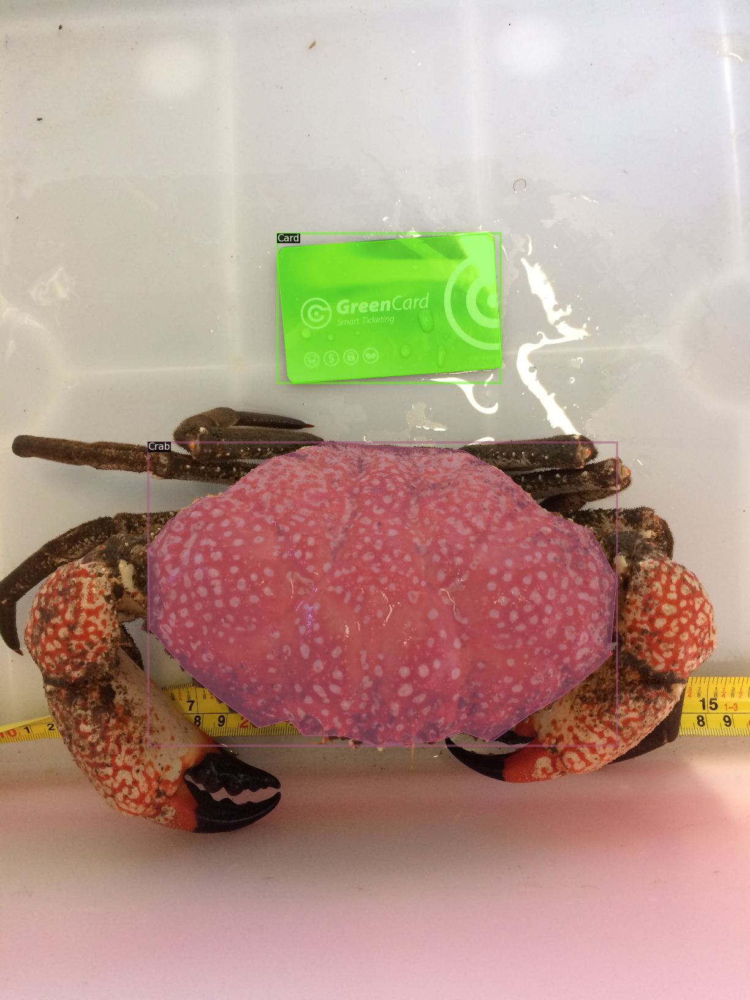

In [5]:

train_meta = MetadataCatalog.get("Crabs_train")
dataset_dicts = DatasetCatalog.get("Crabs_train")
 
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU, or ~2 minutes on a P100 GPU.


In [7]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("Crabs_train",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # 3 classes (data, fig, hazelnut)
# cfg.OUTPUT_DIR = '/content/gdrive/MyDrive/My_Results/'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/20 11:55:02 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:05, 31.6MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[10/20 11:55:13 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  ../aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


[10/20 11:55:42 d2.utils.events]:  eta: 0:22:38  iter: 19  total_loss: 1.993  loss_cls: 1.06  loss_box_reg: 0.2485  loss_mask: 0.6871  loss_rpn_cls: 0.01036  loss_rpn_loc: 0.006803  time: 1.3735  data_time: 0.0673  lr: 1.9981e-05  max_mem: 2334M
[10/20 11:56:10 d2.utils.events]:  eta: 0:22:24  iter: 39  total_loss: 1.569  loss_cls: 0.672  loss_box_reg: 0.2511  loss_mask: 0.6198  loss_rpn_cls: 0.008346  loss_rpn_loc: 0.006346  time: 1.3836  data_time: 0.0079  lr: 3.9961e-05  max_mem: 2334M
[10/20 11:56:38 d2.utils.events]:  eta: 0:21:59  iter: 59  total_loss: 1.1  loss_cls: 0.3127  loss_box_reg: 0.251  loss_mask: 0.5027  loss_rpn_cls: 0.005415  loss_rpn_loc: 0.005633  time: 1.3974  data_time: 0.0089  lr: 5.9941e-05  max_mem: 2334M
[10/20 11:57:07 d2.utils.events]:  eta: 0:21:36  iter: 79  total_loss: 0.9055  loss_cls: 0.2292  loss_box_reg: 0.2678  loss_mask: 0.3892  loss_rpn_cls: 0.003572  loss_rpn_loc: 0.004684  time: 1.4035  data_time: 0.0095  lr: 7.9921e-05  max_mem: 2334M
[10/20 11:

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [10]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader

evaluator = COCOEvaluator("Crabs_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "Crabs_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [10/20 12:34:23 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[10/20 12:34:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/20 12:34:25 d2.data.common]: Serializing 10 elements to byte tensors and concatenating them all ...
[10/20 12:34:25 d2.data.common]: Serialized dataset takes 0.01 MiB
[10/20 12:34:25 d2.evaluation.evaluator]: Start inference on 10 batches
[10/20 12:34:32 d2.evaluation.evaluator]: Total inference time: 0:00:02.672534 (0.534507 s / iter per device, on 1 devices)
[10/20 12:34:32 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.330824 s / iter per device, on 1 devices)
[10/20 12:34:32 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[10/20 12:34:32 d2.evaluation.coco_evaluation]: Saving results to ./

OrderedDict([('bbox',
              {'AP': 99.5049504950495,
               'AP-Card': 99.00990099009901,
               'AP-Crab': 100.0,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 99.5049504950495,
               'APm': nan,
               'APs': nan}),
             ('segm',
              {'AP': 100.0,
               'AP-Card': 100.0,
               'AP-Crab': 100.0,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 100.0,
               'APm': nan,
               'APs': nan})])

'/content/gdrive/MyDrive/LUMS_Data_Testing/ISB_Data/model_final.pth'

In [11]:
!zip -r /content/gdrive/MyDrive/Model-Crab-New.zip /content/output

updating: content/output/ (stored 0%)
updating: content/output/coco_instances_results.json (deflated 81%)
updating: content/output/model_final.pth (deflated 7%)
updating: content/output/Crabs_val_coco_format.json (deflated 75%)
updating: content/output/metrics.json (deflated 76%)
updating: content/output/last_checkpoint (stored 0%)
updating: content/output/instances_predictions.pth (deflated 80%)
updating: content/output/Crabs_val_coco_format.json.lock (stored 0%)
  adding: content/output/events.out.tfevents.1634730907.666013a77045.643.0 (deflated 71%)


In [12]:
from google.colab import files
files.download("/content/gdrive/MyDrive/Model-Crab-New.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
!zip -r /content/gdrive/MyDrive/Model-Crab-New.zip /content/output

updating: content/output/ (stored 0%)
updating: content/output/coco_instances_results.json (deflated 81%)
updating: content/output/model_final.pth (deflated 7%)
updating: content/output/Crabs_val_coco_format.json (deflated 75%)
updating: content/output/metrics.json (deflated 76%)
updating: content/output/last_checkpoint (stored 0%)
updating: content/output/instances_predictions.pth (deflated 80%)
updating: content/output/Crabs_val_coco_format.json.lock (stored 0%)
updating: content/output/events.out.tfevents.1634730907.666013a77045.643.0 (deflated 71%)


In [14]:
f = open('config.yml', 'w')
f.write(cfg.dump())
f.close()

In [15]:

import shutil
  
# Copy src to dst. (cp src dst)
shutil.copy('/content/output/model_final.pth', '/content/gdrive/MyDrive/Crab-Detection/')

'/content/gdrive/MyDrive/Crab-Detection/model_final.pth'

In [16]:
import zipfile
with zipfile.ZipFile('/content/gdrive/MyDrive/Model-Crab-New.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/gdrive/MyDrive/Crab-Detection/output/')

In [17]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.merge_from_file("/content/gdrive/MyDrive/Model-Crab-New/config.yml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
# cfg.MODEL.WEIGHTS = "model_final.pth"


cfg.MODEL.WEIGHTS = os.path.join("/content/gdrive/MyDrive/Crab-Detection/model_final.pth")  # path to the model we just trained
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

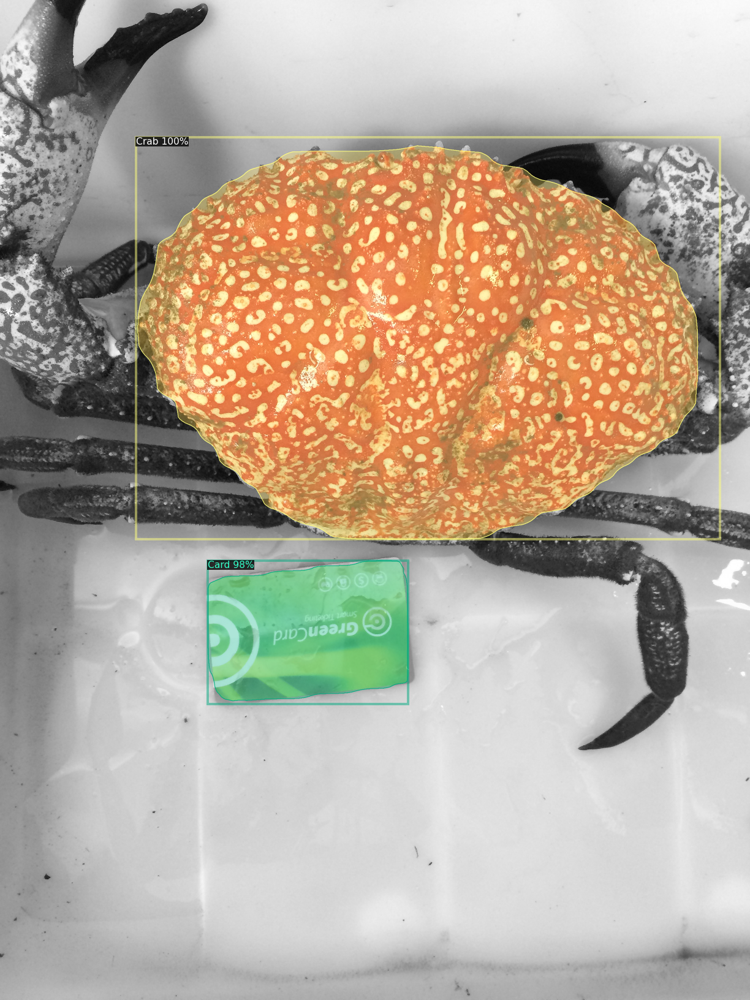

In [21]:
from detectron2.utils.visualizer import ColorMode
# dataset_dicts = get_balloon_dicts("/content/gdrive/MyDrive/val/")
# print(dataset_dicts)
# for d in random.sample(dataset_dicts, 1):    
im = cv2.imread("/content/gdrive/MyDrive/Crab-Detection/test/img50.JPG")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                metadata=balloon_metadata, 
                scale=0.5, 
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [22]:
im = cv2.imread("/content/gdrive/MyDrive/Crab-Detection/test/img50.JPG")
outputs = predictor(im)

In [23]:
outputs = outputs["instances"].to("cpu")

In [24]:
outputs

Instances(num_instances=2, image_height=3264, image_width=2448, fields=[pred_boxes: Boxes(tensor([[ 443.0758,  447.4564, 2349.6025, 1760.7142],
        [ 677.5552, 1829.1807, 1331.8354, 2297.6838]])), scores: tensor([0.9983, 0.9850]), pred_classes: tensor([0, 1]), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, 

In [25]:
coords = outputs.pred_boxes
coords_crab = coords.__getitem__(0).tensor.to("cpu").numpy()
coords_card = coords.__getitem__(1).tensor.to("cpu").numpy()
coords_crab

array([[ 443.0758,  447.4564, 2349.6025, 1760.7142]], dtype=float32)

In [26]:
mask = outputs.pred_masks.numpy()

In [27]:
coords_card

array([[ 677.55524, 1829.1807 , 1331.8354 , 2297.6838 ]], dtype=float32)

In [28]:
x1_crab,y1_crab,x2_crab,y2_crab = int(coords_crab[0][0]) , int(coords_crab[0][1]) , int(coords_crab[0][2]) , int(coords_crab[0][3])

pixels_width_crab = x2_crab - x1_crab
pixels_height_crab = y2_crab - y1_crab

(pixels_width_crab , pixels_height_crab)

(1906, 1313)

In [29]:
x1_card,y1_card,x2_card,y2_card = int(coords_card[0][0]) , int(coords_card[0][1]) , int(coords_card[0][2]) , int(coords_card[0][3])

pixels_width_card = x2_card - x1_card
pixels_height_card = y2_card - y1_card

(pixels_width_card , pixels_height_card)

(654, 468)

In [30]:
width_card = 2.125
height_card = 3.371

width_crab = ( width_card * pixels_width_crab ) / (pixels_width_card-50)

height_crab = ( height_card * pixels_height_crab ) / (pixels_height_card+50)

print("The width of Crab is : " , width_crab , "Inches")

print("The height of crab is : " , height_crab , "Inches")

The width of Crab is :  6.705711920529802 Inches
The height of crab is :  8.544638996138996 Inches
